In [15]:
import sys
sys.path.append('../')

import torch
from glob import glob 
import os
import matplotlib.pyplot as plt
import numpy as np

import matplotlib.pyplot as plt
import cv2

import pandas as pd
import copy

from utils.visualize_data import visualize_batch
from data_prep.dataset import Dataset
from data_prep.dataset_loader import LoadData

# To allow auto reload to this notebook after modifying any external file imported
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
dataset_path_ch1_train = '../datasets/challenge1/train'
dataset_path_ch2_train = '../datasets/challenge2/train'

# ch1 -> class_labels = {'nevus': 0, 'others': 1}
# ch2 -> class_labels = {'mel': 0, 'bcc': 1, 'scc': 2}
train_dataset_df, train_images, train_labels, n_classes = LoadData(dataset_path_ch1_train, class_labels = {'nevus': 0, 'others': 1})

2023-11-30 07:57:29.275 | INFO     | data_prep.dataset_loader:LoadData:24 - Loading the data from ../datasets/challenge1/train


In [3]:
len(train_images)

15195

In [4]:
len(train_labels)

15195

In [5]:
n_classes

2

In [6]:
train_dataset_df['Label'].value_counts()

Label
0    7725
1    7470
Name: count, dtype: int64

In [7]:
dataset = Dataset(
    images_path=train_images,
    labels=train_labels,
    transform=True,
    split="train",
    input_size=(224,224)
    )

2023-11-30 07:57:44.152 | INFO     | data_prep.dataset:__init__:35 - Creating a Dataset instance for train split.


In [8]:
c_weights = dataset.get_class_weight()
c_weights_tensor =torch.tensor(c_weights).float().to(torch.device("cuda")) # class weights

print(c_weights)
print(c_weights_tensor)

(0.508390918065153, 0.491609081934847)
tensor([0.5084, 0.4916], device='cuda:0')


In [9]:
# Define batch size
batch_size = 32

# Create a data loader
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Fetch a batch of data
images, labels = next(iter(data_loader))

# Print the shape of the batch
print("Batch of images shape:", images.shape)
print("Batch of images dtype:", images.dtype)
print("Batch of labels shape:", labels.shape)

/mnt/c/Users/abdal/Documents/Master/EMJMD MAIA/SEMESTER 3 - UdG/CAD/skin-lesion-dl-classifier/env/lib/python3.10/site-packages/albumentations/augmentations/blur/transforms.py:184: UserWarning: blur_limit and sigma_limit minimum value can not be both equal to 0. blur_limit minimum value changed to 3.
  warnings.warn(
/mnt/c/Users/abdal/Documents/Master/EMJMD MAIA/SEMESTER 3 - UdG/CAD/skin-lesion-dl-classifier/env/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/mnt/c/Users/abdal/Documents/Master/EMJMD MAIA/SEMESTER 3 - UdG/CAD/skin-lesion-dl-classifier/env/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Batch of images shape: torch.Size([32, 3, 224, 224])
Batch of images dtype: torch.float32
Batch of labels shape: torch.Size([32])


Visualizing a batch from 'train' dataset type.



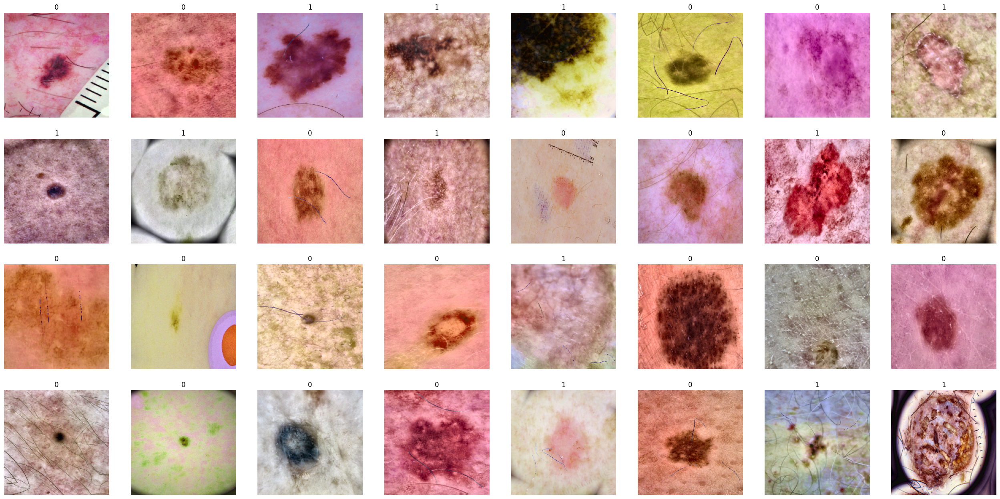

Visualizing a batch from 'train' dataset type.



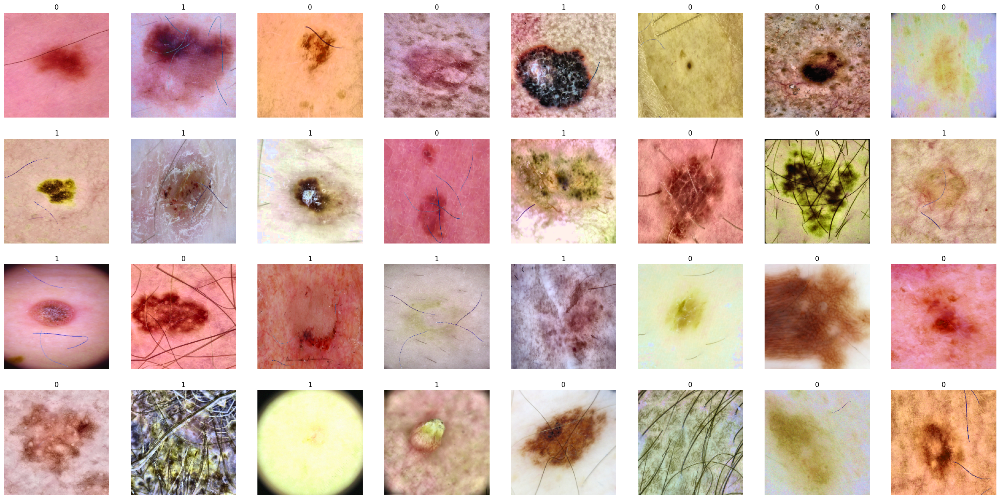

In [25]:
for idx, batch in enumerate(data_loader):
    if idx == 2:
        break
    
    # get the batch
    images, labels = batch

    # visualize the batch
    visualize_batch(images, labels, dataset_type='train')